# Explore and Plot the ATL06 data

In [1]:
import os
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.figsize': (12, 7), 'font.size': 10})

import hvplot
import hvplot.pandas
import geoviews as gv

In [2]:
%matplotlib inline

In [3]:
os.listdir(f'/fs/project/howat.4/icesat2/antarctica_ATL06')

['rema_07_qml_ne',
 'rema_08_qml_se',
 'rema_09_qml_nw',
 'rema_11_amery_shelf',
 'rema_13_wilkes_land_ne',
 'rema_17_wilkes_land_nw',
 'rema_21_mbl_north',
 'rema_02_peninsula_north',
 'rema_03_peninsula_south',
 'rema_04_ronne_shelf',
 'rema_05_ellsworth_land',
 'rema_06_luitpold_coast',
 'rema_15_wilkes_land_nc',
 'rema_10_qml_sw',
 'rema_12_american_highland',
 'rema_14_wilkes_land_se',
 'rema_16_wilkes_land_sc',
 'Readme.txt',
 'rema_19_victoria_land',
 'rema_18_wilkes_land_sw',
 'rema_22_mbl_central',
 'rema_23_siple_coast',
 'x_rema_20_ross_shelf',
 'rema_20_ross_shelf',
 'rema_24_ctam',
 'rema_27_qml_south',
 'rema_25_mbl_south',
 'rema_01_subantarctic_islands']

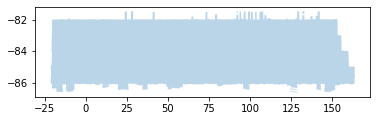

In [5]:
short_name = 'ATL06'
region = 'rema_27_qml_south'#'rema_02_peninsula_north'
icesat2_path = f'/fs/project/howat.4/icesat2/antarctica_{short_name}/{region}'

files = os.listdir(f'{icesat2_path}')
outline = gpd.read_file(f'{icesat2_path}/outline.shp')
# outline = outline.to_crs({'init': 'epsg:4326'})
outline.plot(alpha=.3);

In [6]:
shp_ext = 'shp' #'.gpkg'
hdf_files = [f for f in files if f.endswith('.h5')]
shp_files = [f for f in files if f.endswith(f'.{shp_ext}') and 'ATL06' in f]
csv_files = [f for f in files if f.endswith('.csv') and 'ATL06' in f]
# To pick the largest granule for visualization only
sz_list = [os.path.getsize(f'{icesat2_path}/{hdf}') for hdf in hdf_files]
idx = sz_list.index(max(sz_list)) #largest index
print(f'Count of shp files {len(shp_files)} and hdf = {len(hdf_files)}')

Count of shp files 103 and hdf = 107


In [10]:
# Analyze extracted Dates
ymd = [d.split('_')[2][:8] for d in shp_files]
ymd

In [12]:
ymd = pd.to_datetime(ymd)
ymd

DatetimeIndex(['2018-12-01', '2018-12-01', '2018-12-01', '2018-12-01',
               '2018-12-01', '2018-12-01', '2018-12-01', '2018-12-01',
               '2018-12-01', '2018-12-01',
               ...
               '2018-12-08', '2018-12-08', '2018-12-10', '2018-12-10',
               '2018-12-10', '2018-12-10', '2018-12-10', '2018-12-10',
               '2018-12-10', '2018-12-10'],
              dtype='datetime64[ns]', length=103, freq=None)

In [14]:
ymd.min(), ymd.max()

(Timestamp('2018-12-01 00:00:00'), Timestamp('2018-12-10 00:00:00'))

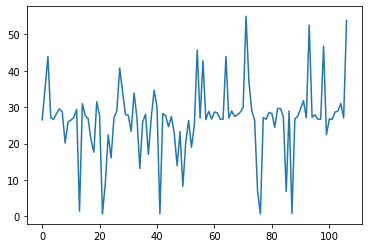

In [15]:
plt.plot([sz/1e6 for sz in sz_list]);

In [16]:
# idx = 4 #aside: choose here manually
fname = shp_files[idx].split(f'.{shp_ext}')[0]
fname

'processed_ATL06_20181207093203_10650111_003_01'

In [17]:
# Load ATL08 parsed data
df = pd.read_csv(f'{icesat2_path}/{fname}.csv', parse_dates=True)
gdf = gpd.read_file(f'{icesat2_path}/{fname}.{shp_ext}', parse_dates=True)
# Pick only the good quality data [verify if zero or one means good]
# df = df[df.q_flag==0]
# gdf = gdf[gdf.q_flag==0]

gtls = list(df.strip.unique())
print(len(df), gtls)
# gv.tile_sources.ESRI * gdf.hvplot.points(geo=True, color='strip', alpha=0.7, width=500, height=700, hover=['strip', 'h_te_media'])

158984 ['gt1l', 'gt1r', 'gt2l', 'gt2r', 'gt3l', 'gt3r']


In [18]:
len(df)

158984

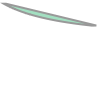

In [19]:
ch = gdf.geometry.unary_union.convex_hull
ch

In [20]:
!echo $TMPDIR

/tmp//2711200.unity-1.asc.ohio-state.edu


In [21]:
y = gdf.geometry.unary_union.envelope
print(y)

POLYGON ((64.56360070668634 -86.18717389533063, 83.14124995111952 -86.18717389533063, 83.14124995111952 -81.788609664109, 64.56360070668634 -81.788609664109, 64.56360070668634 -86.18717389533063))


In [22]:
x = gpd.GeoDataFrame([ch])

In [23]:
# x.hvplot(geo=True, color='strip', alpha=0.7, width=400, height=500)
type(x)

geopandas.geodataframe.GeoDataFrame

In [24]:
# import contextily as ctx

In [25]:
base = gv.tile_sources.ESRI

In [26]:
# base * gdf.hvplot.points(geo=True, color='strip', alpha=0.7, width=800, height=500)

In [27]:
strips = gdf.hvplot.points(geo=True, color='strip', alpha=0.7, width=400, height=500)
# terrain_scatter = df.hvplot(y='lat', x='h_li', kind='scatter', width=300, height=500, alpha=.7).relabel('terrain')

In [30]:
fig1 = base*strips #+ terrain_scatter

In [31]:
# hvplot.save(fig1, f'{icesat2_path}/{fname}.png')
fig1

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [Longitude,Latitude]   (strip)

In [32]:
df.t_dt

0         2018-12-07 09:36:23.142
1         2018-12-07 09:36:23.144
2         2018-12-07 09:36:23.147
3         2018-12-07 09:36:23.150
4         2018-12-07 09:36:23.153
                   ...           
158979    2018-12-07 09:37:37.904
158980    2018-12-07 09:37:37.906
158981    2018-12-07 09:37:37.909
158982    2018-12-07 09:37:37.912
158983    2018-12-07 09:37:37.915
Name: t_dt, Length: 158984, dtype: object

In [33]:
df['t_dt'] = pd.to_datetime(df.t_dt)
df.t_dt

0        2018-12-07 09:36:23.142
1        2018-12-07 09:36:23.144
2        2018-12-07 09:36:23.147
3        2018-12-07 09:36:23.150
4        2018-12-07 09:36:23.153
                   ...          
158979   2018-12-07 09:37:37.904
158980   2018-12-07 09:37:37.906
158981   2018-12-07 09:37:37.909
158982   2018-12-07 09:37:37.912
158983   2018-12-07 09:37:37.915
Name: t_dt, Length: 158984, dtype: datetime64[ns]

In [34]:
df.head()

,lon,lat,h_li,q_flag,t_dt,strip
0,82.270564,-86.187174,3225.9146,0,2018-12-07 09:36:23.142,gt1l
1,82.269159,-86.187025,3226.0576,0,2018-12-07 09:36:23.144,gt1l
2,82.267757,-86.186872,3226.0745,0,2018-12-07 09:36:23.147,gt1l
3,82.266357,-86.186705,3226.0960,0,2018-12-07 09:36:23.150,gt1l
4,82.264957,-86.186534,3226.1394,0,2018-12-07 09:36:23.153,gt1l


In [35]:
# df.hvplot(y='h_li', x='t_dt', by='strip', kind='scatter')

In [36]:
len(hdf_files)

107

In [37]:
import panel as pn
import xarray as xr
import hvplot.xarray
import cartopy.crs as ccrs

In [38]:
rasm = xr.tutorial.open_dataset('rasm').load()
method = rasm.mean(dim='time').hvplot.quadmesh
opts = dict(x='xc', y='yc', cmap='rainbow', coastline=True, geo=True)

In [39]:
pn.interact(lambda **kwargs: method(**kwargs, **opts), rasterize=True, project=True, projection=[ccrs.GOOGLE_MERCATOR, ccrs.Orthographic(90, 30)])

Column
    [0] Column
        [0] Checkbox(name='rasterize', value=True)
        [1] Checkbox(name='project', value=True)
        [2] Select(name='projection', options=[<cartopy.crs.Mercator obj...], value=<cartopy.crs.Mercator o...)
    [1] Row
        [0] HoloViews(DynamicMap, name='interactive03187')